# Russian-Propaganda-BeRT-Sentiment

In [2]:
!pip install vaderSentiment
!pip install hdbscan 
!pip install bertopic
!pip install Ipython

In [113]:
import pandas as pd
import numpy as np
import seaborn as sns
import itertools
import collections
import torch 
import docx2txt
import docx
import string
from string import digits
from numpy import mean   
import unicodedata
import re
import matplotlib.pyplot as plt
from plotnine import *
from plotnine.data import mpg
import copy


from nltk.sentiment.vader import SentimentIntensityAnalyzer as si
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

import bertopic
from bertopic import BERTopic


In [4]:
data = pd.read_excel('TASS_RAW_CONTENT_Alpha_v002.xlsx')

In [5]:
data

,Unnamed: 0,title,link,uploadtime,content
0,0,Nearly 220 civilians hurt as result of Ukraine...,https://tass.com/politics/1836167,"30 AUG, 07:23","KURSK, August 30. /TASS/. Nearly 220 civilians..."
1,1,Ukraine conducting indiscriminate strikes on c...,https://tass.com/politics/1836105,"30 AUG, 06:36","KURSK, August 30. /TASS/. The Ukrainian army i..."
2,2,Nearly 30 Ukrainian drones attack Belgorod Reg...,https://tass.com/politics/1836079,"30 AUG, 05:58","BELGOROD, August 30. /TASS/. A total of 26 unm..."
3,3,Ukrainian POW claims he was unaware of deploym...,https://tass.com/politics/1836057,"30 AUG, 05:08","MOSCOW, August 30. /TASS/. Ukrainian servicema..."
4,4,Russian forces destroy Ukrainian artillery gun...,https://tass.com/politics/1836045,"30 AUG, 04:48","LUGANSK, August 30. /TASS/. Russian forces des..."
...,...,...,...,...,...
16358,16358,"Blasts heard in Kiev, Mariupol — agencies",https://tass.com/politics/1409293,"23 FEB 2022, 23:23","LONDON, February 24. /TASS/. Sounds similar to..."
16359,16359,Ukrainian president declares martial law acros...,https://tass.com/world/1409273,"23 FEB 2022, 23:00",The Ukrainian authorities are declaring martia...
16360,16360,Direct attack against Russia to result in over...,https://tass.com/politics/1409247,"23 FEB 2022, 22:30","MOSCOW, February 24. /TASS/. Russia remains on..."
16361,16361,Putin urges Ukrainian military to disarm,https://tass.com/politics/1409229,"23 FEB 2022, 22:20",© Russian Presidential Press and Information O...


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16363 entries, 0 to 16362
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  16363 non-null  int64 
 1   title       16363 non-null  object
 2   link        16363 non-null  object
 3   uploadtime  16363 non-null  object
 4   content     16352 non-null  object
dtypes: int64(1), object(4)
memory usage: 639.3+ KB


In [7]:
!pip install spacy
!python -m spacy download en_core_web_sm

     ---------------------------------------- 12.8/12.8 MB 4.0 MB/s eta 0:00:00
[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [8]:
import nltk
from nltk.corpus import stopwords
from nltk import bigrams
from textblob import TextBlob
from torch import nn
from torch import optim

In [9]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jbenc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

# Preprocessing Data

In [10]:
stop_words = stopwords.words('english')

In [11]:
#First let's remove all punctuation from our dataset.
data1 = data
data1['content']=data1['content'].astype(str)
data1['content']=data1['content'].str.replace(r'[^\w\s]','')

data1['title']=data1['title'].astype(str)
data1['title']=data1['title'].str.replace(r'[^\w\s]','')

In [12]:
#Next let's remove all stopwords from our dataset.
data1['content']=data1['content'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
data1['content']=data1['content'].str.lower()   

data1['title']=data1['title'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
data1['title']=data1['title'].str.lower()    

In [13]:
#Next we shall trim off the header of each article to just get the text of the article itself
data1['content']=data1['content'].apply(lambda x: ' '.join(x.split(' ')[4:]))

In [14]:
#Next we are going to change all references of Ukrainian to Ukraine, Russian to Russia, and remove said from the corpus
data1['content']=data1['content'].replace({'ukrainian':'ukraine','russian':'russia','said':''}, regex =True)

In [15]:
data1

,Unnamed: 0,title,link,uploadtime,content
0,0,nearly 220 civilians hurt result ukraine attac...,https://tass.com/politics/1836167,"30 AUG, 07:23","nearly 220 civilians, including 11 children, h..."
1,1,ukraine conducting indiscriminate strikes civi...,https://tass.com/politics/1836105,"30 AUG, 06:36",the ukraine army conducting indiscriminate str...
2,2,nearly 30 ukrainian drones attack belgorod reg...,https://tass.com/politics/1836079,"30 AUG, 05:58",a total 26 unmanned aerial vehicles (uavs) ukr...
3,3,ukrainian pow claims unaware deployment kursk ...,https://tass.com/politics/1836057,"30 AUG, 05:08","ukraine serviceman andrey dolgy, surrendered r..."
4,4,russian forces destroy ukrainian artillery gun...,https://tass.com/politics/1836045,"30 AUG, 04:48",russia forces destroyed ukraine self-propelled...
...,...,...,...,...,...
16358,16358,"blasts heard kiev, mariupol — agencies",https://tass.com/politics/1409293,"23 FEB 2022, 23:23",sounds similar artillery fire heard ukraine ca...
16359,16359,ukrainian president declares martial law acros...,https://tass.com/world/1409273,"23 FEB 2022, 23:00","martial law across country, president vladimir..."
16360,16360,direct attack russia result overthrow potentia...,https://tass.com/politics/1409247,"23 FEB 2022, 22:30",russia remains one strongest nuclear powers pl...
16361,16361,putin urges ukrainian military disarm,https://tass.com/politics/1409229,"23 FEB 2022, 22:20",information office/tass


In [16]:
#Time to convert all upload times to datetime 
def search_words(text):
    result = re.findall(r'\b[^\d\W]+\b', text)
    return " ".join(result)

In [17]:
i=0
months=['JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']
data1['Day']=data1['uploadtime'].str[:2]
#data1['Month']=data1['uploadtime'].str[3:6]
data1['Month']=data1['uploadtime'].apply(lambda x : search_words(x))
data1['Year']=np.where(data1['uploadtime'].str.len()>14,'2022','2023')
data1['Hour']=data1['uploadtime'].str[-5:-3]
data1['Minute']=data1['uploadtime'].str[-2:]

In [18]:
data1['Month']=data1['Month'].astype(str)
data1['MDate']=data1[['Month','Year']].agg(', '.join,axis=1)
data1['Date']=data1[['Day','Month','Year']].agg('-'.join,axis=1)

In [19]:
data1

,Unnamed: 0,title,link,uploadtime,content,Day,Month,Year,Hour,Minute,MDate,Date
0,0,nearly 220 civilians hurt result ukraine attac...,https://tass.com/politics/1836167,"30 AUG, 07:23","nearly 220 civilians, including 11 children, h...",30,AUG,2023,07,23,"AUG, 2023",30-AUG-2023
1,1,ukraine conducting indiscriminate strikes civi...,https://tass.com/politics/1836105,"30 AUG, 06:36",the ukraine army conducting indiscriminate str...,30,AUG,2023,06,36,"AUG, 2023",30-AUG-2023
2,2,nearly 30 ukrainian drones attack belgorod reg...,https://tass.com/politics/1836079,"30 AUG, 05:58",a total 26 unmanned aerial vehicles (uavs) ukr...,30,AUG,2023,05,58,"AUG, 2023",30-AUG-2023
3,3,ukrainian pow claims unaware deployment kursk ...,https://tass.com/politics/1836057,"30 AUG, 05:08","ukraine serviceman andrey dolgy, surrendered r...",30,AUG,2023,05,08,"AUG, 2023",30-AUG-2023
4,4,russian forces destroy ukrainian artillery gun...,https://tass.com/politics/1836045,"30 AUG, 04:48",russia forces destroyed ukraine self-propelled...,30,AUG,2023,04,48,"AUG, 2023",30-AUG-2023
...,...,...,...,...,...,...,...,...,...,...,...,...
16358,16358,"blasts heard kiev, mariupol — agencies",https://tass.com/politics/1409293,"23 FEB 2022, 23:23",sounds similar artillery fire heard ukraine ca...,23,FEB,2022,23,23,"FEB, 2022",23-FEB-2022
16359,16359,ukrainian president declares martial law acros...,https://tass.com/world/1409273,"23 FEB 2022, 23:00","martial law across country, president vladimir...",23,FEB,2022,23,00,"FEB, 2022",23-FEB-2022
16360,16360,direct attack russia result overthrow potentia...,https://tass.com/politics/1409247,"23 FEB 2022, 22:30",russia remains one strongest nuclear powers pl...,23,FEB,2022,22,30,"FEB, 2022",23-FEB-2022
16361,16361,putin urges ukrainian military disarm,https://tass.com/politics/1409229,"23 FEB 2022, 22:20",information office/tass,23,FEB,2022,22,20,"FEB, 2022",23-FEB-2022


In [20]:
data1['Category']=data1['link'].str.replace('https://tass.com/','')
data1['Category']=data1['Category'].str.replace('/','')
data1['Category']=data1['Category'].str.replace('\d+','',regex=True)

In [21]:
data1['Category']

0        politics
1        politics
2        politics
3        politics
4        politics
           ...   
16358    politics
16359       world
16360    politics
16361    politics
16362    politics
Name: Category, Length: 16363, dtype: object

# EDA

In [22]:
df=data1

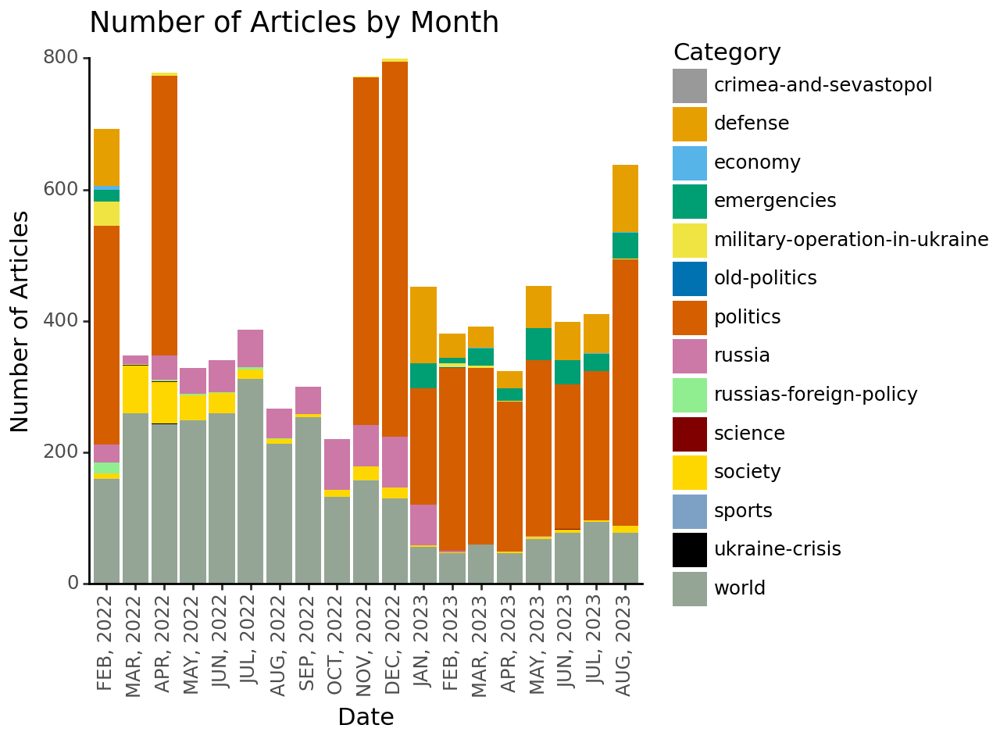

<Figure Size: (640 x 480)>

In [23]:
plt.rcParams['figure.figsize']=(20,20)
cbp1 = ["#999999", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7","#90ee90", "#800000","#FFD700",  "#7da1c4", "#000000", "#94a596" ]
order = ['FEB, 2022','MAR, 2022','APR, 2022','MAY, 2022','JUN, 2022','JUL, 2022','AUG, 2022','SEP, 2022','OCT, 2022','NOV, 2022','DEC, 2022','JAN, 2023','FEB, 2023','MAR, 2023','APR, 2023','MAY, 2023','JUN, 2023','JUL, 2023','AUG, 2023']
(ggplot(df)+aes(x='MDate',fill='Category')+geom_bar(position='stack',size=20)+labs(y='Number of Articles',x='Date',title='Number of Articles by Month')+scale_x_discrete(limits=order)+scale_y_continuous(expand=(0,0),limits = (0,800))+theme_classic()+theme(axis_text_x = element_text(angle=90))+scale_fill_manual(values=cbp1))

# Loading Data

In [24]:
tData = data1[['content','Category']]
tData

,content,Category
0,"nearly 220 civilians, including 11 children, h...",politics
1,the ukraine army conducting indiscriminate str...,politics
2,a total 26 unmanned aerial vehicles (uavs) ukr...,politics
3,"ukraine serviceman andrey dolgy, surrendered r...",politics
4,russia forces destroyed ukraine self-propelled...,politics
...,...,...
16358,sounds similar artillery fire heard ukraine ca...,politics
16359,"martial law across country, president vladimir...",world
16360,russia remains one strongest nuclear powers pl...,politics
16361,information office/tass,politics


In [25]:
cols = tData.columns.tolist()
cols = cols[-1:] + cols[:-1]
tData = tData[cols]
tData

,Category,content
0,politics,"nearly 220 civilians, including 11 children, h..."
1,politics,the ukraine army conducting indiscriminate str...
2,politics,a total 26 unmanned aerial vehicles (uavs) ukr...
3,politics,"ukraine serviceman andrey dolgy, surrendered r..."
4,politics,russia forces destroyed ukraine self-propelled...
...,...,...
16358,politics,sounds similar artillery fire heard ukraine ca...
16359,world,"martial law across country, president vladimir..."
16360,politics,russia remains one strongest nuclear powers pl...
16361,politics,information office/tass


In [26]:
LData = tData[:50000]
docs = LData.content.to_list()

# Loading Model

In [27]:
model = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)


In [28]:
model.get_topic_freq()

,Topic,Count
0,-1,4455
11,0,1310
6,1,683
25,2,254
40,3,233
...,...,...
137,264,11
268,265,11
197,266,11
201,267,10


In [29]:
model.visualize_topics()

In [30]:
model.visualize_barchart()

In [31]:
model.visualize_heatmap()

In [32]:
model.visualize_hierarchy()

In [33]:
model.visualize_term_rank()

# Monthly Resolution

In [34]:
data2 = data1[['Category','content','MDate']]

In [35]:
feb22df = data2[data2['MDate'] == 'FEB, 2022']
mar22df = data2[data2['MDate'] == 'MAR, 2022']
apr22df = data2[data2['MDate'] == 'APR, 2022']
may22df = data2[data2['MDate'] == 'MAY, 2022']
jun22df = data2[data2['MDate'] == 'JUN, 2022']
jul22df = data2[data2['MDate'] == 'JUL, 2022']
aug22df = data2[data2['MDate'] == 'AUG, 2022']
sep22df = data2[data2['MDate'] == 'SEP, 2022']
oct22df = data2[data2['MDate'] == 'OCT, 2022']
nov22df = data2[data2['MDate'] == 'NOV, 2022']
dec22df = data2[data2['MDate'] == 'DEC, 2022']
jan23df = data2[data2['MDate'] == 'JAN, 2023']
feb23df = data2[data2['MDate'] == 'FEB, 2023']
mar23df = data2[data2['MDate'] == 'MAR, 2023']
apr23df = data2[data2['MDate'] == 'APR, 2023']
may23df = data2[data2['MDate'] == 'MAY, 2023']
jun23df = data2[data2['MDate'] == 'JUN, 2023']
jul23df = data2[data2['MDate'] == 'JUL, 2023']
aug23df = data2[data2['MDate'] == 'AUG, 2023']

dfMlist = [feb22df,mar22df,apr22df,may22df,jun22df,jul22df,aug22df,sep22df,oct22df,nov22df,dec22df,jan23df,feb23df,mar23df,apr23df,may23df,jun23df,jul23df,aug23df]


In [36]:
#for item in dfMlist:
#    item.drop(['MDate'], axis=1, inplace=True)

In [37]:
#def remove_digits(plist):
    

In [38]:
MTopics = []
for item in dfMlist:
    docs = item.content.to_list()
    tempModel = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
    for i, topic in enumerate(tempModel.topics_):
        tlist = tempModel.get_topic(i)
        Topic = {
            'Month':item['MDate'].iloc[0],
            'Topic Number':i,
            'Topic Keywords':tlist,
        }
        MTopics.append(Topic)

In [39]:
MTopicsDF = pd.DataFrame(MTopics)
MTopicsDF

,Month,Topic Number,Topic Keywords
0,"FEB, 2022",0,"[(russia, 0.0555095438225863), (ukraine, 0.052..."
1,"FEB, 2022",1,"[(ukraine, 0.05225366124709232), (forces, 0.05..."
2,"FEB, 2022",2,"[(, 1e-05), (, 1e-05), (, 1e-05), (, 1e-05), (..."
3,"FEB, 2022",3,"[(tass, 0.4673889043171159), (ap, 0.1776756445..."
4,"FEB, 2022",4,"[(shelling, 0.06365839264337027), (donetsk, 0...."
...,...,...,...
15688,"AUG, 2023",633,False
15689,"AUG, 2023",634,False
15690,"AUG, 2023",635,False
15691,"AUG, 2023",636,False


In [40]:
def filter_row_by_values(df,col,values):
    return df[~df[col].isin(values)]

In [41]:
MTopicsDF= MTopicsDF.dropna()
MTopicsDF

,Month,Topic Number,Topic Keywords
0,"FEB, 2022",0,"[(russia, 0.0555095438225863), (ukraine, 0.052..."
1,"FEB, 2022",1,"[(ukraine, 0.05225366124709232), (forces, 0.05..."
2,"FEB, 2022",2,"[(, 1e-05), (, 1e-05), (, 1e-05), (, 1e-05), (..."
3,"FEB, 2022",3,"[(tass, 0.4673889043171159), (ap, 0.1776756445..."
4,"FEB, 2022",4,"[(shelling, 0.06365839264337027), (donetsk, 0...."
...,...,...,...
15688,"AUG, 2023",633,False
15689,"AUG, 2023",634,False
15690,"AUG, 2023",635,False
15691,"AUG, 2023",636,False


In [42]:
filter_row_by_values(MTopicsDF,'Topic Keywords',['False'])
MTopicsDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15693 entries, 0 to 15692
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Month           15693 non-null  object
 1   Topic Number    15693 non-null  int64 
 2   Topic Keywords  15693 non-null  object
dtypes: int64(1), object(2)
memory usage: 367.9+ KB


In [43]:
feb22Data = feb22df[:50000]
docs = feb22Data.content.to_list()
modelf22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelf22.visualize_barchart()

In [44]:
mar22Data = mar22df[:50000]
docs = mar22Data.content.to_list()
modelmr22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelmr22.visualize_barchart()

In [45]:
apr22Data = apr22df[:50000]
docs = apr22Data.content.to_list()
modela22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modela22.visualize_barchart()

In [46]:
may22Data = may22df[:50000]
docs = may22Data.content.to_list()
modelmy22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelmy22.visualize_barchart()

In [47]:
jun22Data = jun22df[:50000]
docs = jun22Data.content.to_list()
modelju22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelju22.visualize_barchart()

In [48]:
jul22Data = jul22df[:50000]
docs = jul22Data.content.to_list()
modeljy22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modeljy22.visualize_barchart()

In [49]:
aug22Data = aug22df[:50000]
docs = aug22Data.content.to_list()
modelau22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelau22.visualize_barchart()

In [50]:
sep22Data = sep22df[:50000]
docs = sep22Data.content.to_list()
modelsp22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelsp22.visualize_barchart()

In [51]:
oct22Data = oct22df[:50000]
docs = oct22Data.content.to_list()
modeloc22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modeloc22.visualize_barchart()

In [52]:
nov22Data = nov22df[:50000]
docs = nov22Data.content.to_list()
modelnv22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelnv22.visualize_barchart()

In [53]:
dec22Data = dec22df[:50000]
docs = dec22Data.content.to_list()
modeldc22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modeldc22.visualize_barchart()

In [54]:
jan23Data = jan23df[:50000]
docs = jan23Data.content.to_list()
modelja23 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelja23.visualize_barchart()

In [55]:
feb23Data = feb23df[:50000]
docs = feb23Data.content.to_list()
modelf23 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelf23.visualize_barchart()

In [56]:
mar23Data = mar23df[:50000]
docs = mar23Data.content.to_list()
modelma23 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelma23.visualize_barchart()

In [57]:
apr23Data = apr23df[:50000]
docs = apr23Data.content.to_list()
modelap23 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelap23.visualize_barchart()

In [58]:
may23Data = may23df[:50000]
docs = may23Data.content.to_list()
modelmy23 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelmy23.visualize_barchart()

In [59]:
jun23Data = jun23df[:50000]
docs = jun23Data.content.to_list()
modelju23 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelju23.visualize_barchart()

In [60]:
jul23Data = jul23df[:50000]
docs = jul23Data.content.to_list()
modeljy23 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modeljy23.visualize_barchart()

In [61]:
aug23Data = aug23df[:50000]
docs = aug23Data.content.to_list()
modelau23 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs)
modelau23.visualize_barchart()

# Categorical Resolution

In [62]:
data3 = data1.copy().dropna()
data3 = data3[data3['content'].str.split().map(len) > 2]
feb22dfCri = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='crimea-and-sevastopol')]
feb22dfDef = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='defense')]
feb22dfEco = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='economy')]
feb22dfEme = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='emergencies')]
feb22dfMil = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='military-operation-in-ukraine')]
feb22dfPol = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='politics')]
feb22dfRus = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='russia')]
feb22dfRfp = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='russias-foreign-policy')]
feb22dfSci = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='science')]
feb22dfSoc = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='society')]
feb22dfSpo = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='sport')]
feb22dfUkr = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='ukraine')]
feb22dfWor = data1[(data1['MDate'] == 'FEB, 2022')&(data1['Category']=='world')]

mar22dfCri = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='crimea-and-sevastopol')]
mar22dfDef = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='defense')]
mar22dfEco = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='economy')]
mar22dfEme = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='emergencies')]
mar22dfMil = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='military-operation-in-ukraine')]
mar22dfPol = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='politics')]
mar22dfRus = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='russia')]
mar22dfRfp = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='russias-foreign-policy')]
mar22dfSci = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='science')]
mar22dfSoc = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='society')]
mar22dfSpo = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='sport')]
mar22dfUkr = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='ukraine')]
mar22dfWor = data1[(data1['MDate'] == 'MAR, 2022')&(data1['Category']=='world')]

apr22dfCri = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='crimea-and-sevastopol')]
apr22dfDef = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='defense')]
apr22dfEco = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='economy')]
apr22dfEme = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='emergencies')]
apr22dfMil = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='military-operation-in-ukraine')]
apr22dfPol = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='politics')]
apr22dfRus = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='russia')]
apr22dfRfp = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='russias-foreign-policy')]
apr22dfSci = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='science')]
apr22dfSoc = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='society')]
apr22dfSpo = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='sport')]
apr22dfUkr = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='ukraine')]
apr22dfWor = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='world')]

may22dfCri = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='crimea-and-sevastopol')]
may22dfDef = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='defense')]
may22dfEco = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='economy')]
may22dfEme = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='emergencies')]
may22dfMil = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='military-operation-in-ukraine')]
may22dfPol = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='politics')]
may22dfRus = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='russia')]
may22dfRfp = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='russias-foreign-policy')]
may22dfSci = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='science')]
may22dfSoc = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='society')]
may22dfSpo = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='sport')]
may22dfUkr = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='ukraine')]
may22dfWor = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='world')]

jun22dfCri = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='crimea-and-sevastopol')]
jun22dfDef = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='defense')]
jun22dfEco = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='economy')]
jun22dfEme = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='emergencies')]
jun22dfMil = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='military-operation-in-ukraine')]
jun22dfPol = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='politics')]
jun22dfRus = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='russia')]
jun22dfRfp = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='russias-foreign-policy')]
jun22dfSci = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='science')]
jun22dfSoc = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='society')]
jun22dfSpo = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='sport')]
jun22dfUkr = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='ukraine')]
jun22dfWor = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='world')]                   
                    
jul22dfCri = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='crimea-and-sevastopol')]
jul22dfDef = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='defense')]
jul22dfEco = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='economy')]
jul22dfEme = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='emergencies')]
jul22dfMil = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='military-operation-in-ukraine')]
jul22dfPol = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='politics')]
jul22dfRus = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='russia')]
jul22dfRfp = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='russias-foreign-policy')]
jul22dfSci = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='science')]
jul22dfSoc = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='society')]
jul22dfSpo = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='sport')]
jul22dfUkr = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='ukraine')]
jul22dfWor = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='world')]

aug22dfCri = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='crimea-and-sevastopol')]
aug22dfDef = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='defense')]
aug22dfEco = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='economy')]
aug22dfEme = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='emergencies')]
aug22dfMil = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='military-operation-in-ukraine')]
aug22dfPol = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='politics')]
aug22dfRus = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='russia')]
aug22dfRfp = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='russias-foreign-policy')]
aug22dfSci = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='science')]
aug22dfSoc = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='society')]
aug22dfSpo = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='sport')]
aug22dfUkr = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='ukraine')]
aug22dfWor = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='world')]

sep22dfCri = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='crimea-and-sevastopol')]
sep22dfDef = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='defense')]
sep22dfEco = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='economy')]
sep22dfEme = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='emergencies')]
sep22dfMil = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='military-operation-in-ukraine')]
sep22dfPol = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='politics')]
sep22dfRus = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='russia')]
sep22dfRfp = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='russias-foreign-policy')]
sep22dfSci = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='science')]
sep22dfSoc = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='society')]
sep22dfSpo = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='sport')]
sep22dfUkr = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='ukraine')]
sep22dfWor = data1[(data1['MDate'] == 'SEP, 2022')&(data1['Category']=='world')]

oct22dfCri = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='crimea-and-sevastopol')]
oct22dfDef = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='defense')]
oct22dfEco = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='economy')]
oct22dfEme = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='emergencies')]
oct22dfMil = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='military-operation-in-ukraine')]
oct22dfPol = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='politics')]
oct22dfRus = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='russia')]
oct22dfRfp = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='russias-foreign-policy')]
oct22dfSci = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='science')]
oct22dfSoc = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='society')]
oct22dfSpo = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='sport')]
oct22dfUkr = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='ukraine')]
oct22dfWor = data1[(data1['MDate'] == 'OCT, 2022')&(data1['Category']=='world')]

nov22dfCri = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='crimea-and-sevastopol')]
nov22dfDef = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='defense')]
nov22dfEco = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='economy')]
nov22dfEme = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='emergencies')]
nov22dfMil = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='military-operation-in-ukraine')]
nov22dfPol = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='politics')]
nov22dfRus = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='russia')]
nov22dfRfp = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='russias-foreign-policy')]
nov22dfSci = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='science')]
nov22dfSoc = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='society')]
nov22dfSpo = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='sport')]
nov22dfUkr = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='ukraine')]
nov22dfWor = data1[(data1['MDate'] == 'NOV, 2022')&(data1['Category']=='world')]

dec22dfCri = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='crimea-and-sevastopol')]
dec22dfDef = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='defense')]
dec22dfEco = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='economy')]
dec22dfEme = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='emergencies')]
dec22dfMil = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='military-operation-in-ukraine')]
dec22dfPol = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='politics')]
dec22dfRus = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='russia')]
dec22dfRfp = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='russias-foreign-policy')]
dec22dfSci = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='science')]
dec22dfSoc = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='society')]
dec22dfSpo = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='sport')]
dec22dfUkr = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='ukraine')]
dec22dfWor = data1[(data1['MDate'] == 'DEC, 2022')&(data1['Category']=='world')]

jan23dfCri = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='crimea-and-sevastopol')]
jan23dfDef = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='defense')]
jan23dfEco = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='economy')]
jan23dfEme = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='emergencies')]
jan23dfMil = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='military-operation-in-ukraine')]
jan23dfPol = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='politics')]
jan23dfRus = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='russia')]
jan23dfRfp = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='russias-foreign-policy')]
jan23dfSci = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='science')]
jan23dfSoc = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='society')]
jan23dfSpo = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='sport')]
jan23dfUkr = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='ukraine')]
jan23dfWor = data1[(data1['MDate'] == 'JAN, 2023')&(data1['Category']=='world')]

feb23dfCri = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='crimea-and-sevastopol')]
feb23dfDef = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='defense')]
feb23dfEco = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='economy')]
feb23dfEme = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='emergencies')]
feb23dfMil = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='military-operation-in-ukraine')]
feb23dfPol = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='politics')]
feb23dfRus = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='russia')]
feb23dfRfp = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='russias-foreign-policy')]
feb23dfSci = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='science')]
feb23dfSoc = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='society')]
feb23dfSpo = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='sport')]
feb23dfUkr = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='ukraine')]
feb23dfWor = data1[(data1['MDate'] == 'FEB, 2023')&(data1['Category']=='world')]

mar23dfCri = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='crimea-and-sevastopol')]
mar23dfDef = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='defense')]
mar23dfEco = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='economy')]
mar23dfEme = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='emergencies')]
mar23dfMil = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='military-operation-in-ukraine')]
mar23dfPol = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='politics')]
mar23dfRus = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='russia')]
mar23dfRfp = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='russias-foreign-policy')]
mar23dfSci = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='science')]
mar23dfSoc = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='society')]
mar23dfSpo = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='sport')]
mar23dfUkr = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='ukraine')]
mar23dfWor = data1[(data1['MDate'] == 'MAR, 2023')&(data1['Category']=='world')]

apr23dfCri = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='crimea-and-sevastopol')]
apr23dfDef = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='defense')]
apr23dfEco = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='economy')]
apr23dfEme = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='emergencies')]
apr23dfMil = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='military-operation-in-ukraine')]
apr23dfPol = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='politics')]
apr23dfRus = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='russia')]
apr23dfRfp = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='russias-foreign-policy')]
apr23dfSci = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='science')]
apr23dfSoc = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='society')]
apr23dfSpo = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='sport')]
apr23dfUkr = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='ukraine')]
apr23dfWor = data1[(data1['MDate'] == 'APR, 2022')&(data1['Category']=='world')]

may23dfCri = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='crimea-and-sevastopol')]
may23dfDef = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='defense')]
may23dfEco = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='economy')]
may23dfEme = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='emergencies')]
may23dfMil = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='military-operation-in-ukraine')]
may23dfPol = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='politics')]
may23dfRus = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='russia')]
may23dfRfp = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='russias-foreign-policy')]
may23dfSci = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='science')]
may23dfSoc = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='society')]
may23dfSpo = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='sport')]
may23dfUkr = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='ukraine')]
may23dfWor = data1[(data1['MDate'] == 'MAY, 2022')&(data1['Category']=='world')]

jun23dfCri = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='crimea-and-sevastopol')]
jun23dfDef = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='defense')]
jun23dfEco = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='economy')]
jun23dfEme = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='emergencies')]
jun23dfMil = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='military-operation-in-ukraine')]
jun23dfPol = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='politics')]
jun23dfRus = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='russia')]
jun23dfRfp = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='russias-foreign-policy')]
jun23dfSci = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='science')]
jun23dfSoc = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='society')]
jun23dfSpo = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='sport')]
jun23dfUkr = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='ukraine')]
jun23dfWor = data1[(data1['MDate'] == 'JUN, 2022')&(data1['Category']=='world')]                   
                    
jul23dfCri = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='crimea-and-sevastopol')]
jul23dfDef = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='defense')]
jul23dfEco = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='economy')]
jul23dfEme = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='emergencies')]
jul23dfMil = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='military-operation-in-ukraine')]
jul23dfPol = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='politics')]
jul23dfRus = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='russia')]
jul23dfRfp = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='russias-foreign-policy')]
jul23dfSci = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='science')]
jul23dfSoc = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='society')]
jul23dfSpo = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='sport')]
jul23dfUkr = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='ukraine')]
jul23dfWor = data1[(data1['MDate'] == 'JUL, 2022')&(data1['Category']=='world')]

aug23dfCri = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='crimea-and-sevastopol')]
aug23dfDef = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='defense')]
aug23dfEco = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='economy')]
aug23dfEme = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='emergencies')]
aug23dfMil = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='military-operation-in-ukraine')]
aug23dfPol = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='politics')]
aug23dfRus = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='russia')]
aug23dfRfp = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='russias-foreign-policy')]
aug23dfSci = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='science')]
aug23dfSoc = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='society')]
aug23dfSpo = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='sport')]
aug23dfUkr = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='ukraine')]
aug23dfWor = data1[(data1['MDate'] == 'AUG, 2022')&(data1['Category']=='world')]
              
              
              
              
dfGrpMlist = [feb22dfCri,feb22dfDef,feb22dfEco,feb22dfEme,feb22dfMil,feb22dfPol,feb22dfRus,feb22dfRfp,feb22dfSci,feb22dfSoc,feb22dfSpo,feb22dfUkr,feb22dfWor,
             mar22dfCri,mar22dfDef,mar22dfEco,mar22dfEme,mar22dfMil,mar22dfPol,mar22dfRus,mar22dfRfp,mar22dfSci,mar22dfSoc,mar22dfSpo,mar22dfUkr,mar22dfWor,
             apr22dfCri,apr22dfDef,apr22dfEco,apr22dfEme,apr22dfMil,apr22dfPol,apr22dfRus,apr22dfRfp,apr22dfSci,apr22dfSoc,apr22dfSpo,apr22dfUkr,apr22dfWor,
             may22dfCri,may22dfDef,may22dfEco,may22dfEme,may22dfMil,may22dfPol,may22dfRus,may22dfRfp,may22dfSci,may22dfSoc,may22dfSpo,may22dfUkr,may22dfWor,
             jun22dfCri,jun22dfDef,jun22dfEco,jun22dfEme,jun22dfMil,jun22dfPol,jun22dfRus,jun22dfRfp,jun22dfSci,jun22dfSoc,jun22dfSpo,jun22dfUkr,jun22dfWor,
             jul22dfCri,jul22dfDef,jul22dfEco,jul22dfEme,jul22dfMil,jul22dfPol,jul22dfRus,jul22dfRfp,jul22dfSci,jul22dfSoc,jul22dfSpo,jul22dfUkr,jul22dfWor,
             aug22dfCri,aug22dfDef,aug22dfEco,aug22dfEme,aug22dfMil,aug22dfPol,aug22dfRus,aug22dfRfp,aug22dfSci,aug22dfSoc,aug22dfSpo,aug22dfUkr,aug22dfWor,
             sep22dfCri,sep22dfDef,sep22dfEco,sep22dfEme,sep22dfMil,sep22dfPol,sep22dfRus,sep22dfRfp,sep22dfSci,sep22dfSoc,sep22dfSpo,sep22dfUkr,sep22dfWor,
             oct22dfCri,oct22dfDef,oct22dfEco,oct22dfEme,oct22dfMil,oct22dfPol,oct22dfRus,oct22dfRfp,oct22dfSci,oct22dfSoc,oct22dfSpo,oct22dfUkr,oct22dfWor,
             nov22dfCri,nov22dfDef,nov22dfEco,nov22dfEme,nov22dfMil,nov22dfPol,nov22dfRus,nov22dfRfp,nov22dfSci,nov22dfSoc,nov22dfSpo,nov22dfUkr,nov22dfWor,
             dec22dfCri,dec22dfDef,dec22dfEco,dec22dfEme,dec22dfMil,dec22dfPol,dec22dfRus,dec22dfRfp,dec22dfSci,dec22dfSoc,dec22dfSpo,dec22dfUkr,dec22dfWor,
             jan23dfCri,jan23dfDef,jan23dfEco,jan23dfEme,jan23dfMil,jan23dfPol,jan23dfRus,jan23dfRfp,jan23dfSci,jan23dfSoc,jan23dfSpo,jan23dfUkr,jan23dfWor,
             feb23dfCri,feb23dfDef,feb23dfEco,feb23dfEme,feb23dfMil,feb23dfPol,feb23dfRus,feb23dfRfp,feb23dfSci,feb23dfSoc,feb23dfSpo,feb23dfUkr,feb23dfWor,
             mar23dfCri,mar23dfDef,mar23dfEco,mar23dfEme,mar23dfMil,mar23dfPol,mar23dfRus,mar23dfRfp,mar23dfSci,mar23dfSoc,mar23dfSpo,mar23dfUkr,mar23dfWor,
             apr23dfCri,apr23dfDef,apr23dfEco,apr23dfEme,apr23dfMil,apr23dfPol,apr23dfRus,apr23dfRfp,apr23dfSci,apr23dfSoc,apr23dfSpo,apr23dfUkr,apr23dfWor,
             may23dfCri,may23dfDef,may23dfEco,may23dfEme,may23dfMil,may23dfPol,may23dfRus,may23dfRfp,may23dfSci,may23dfSoc,may23dfSpo,may23dfUkr,may23dfWor,
             jun23dfCri,jun23dfDef,jun23dfEco,jun23dfEme,jun23dfMil,jun23dfPol,jun23dfRus,jun23dfRfp,jun23dfSci,jun23dfSoc,jun23dfSpo,jun23dfUkr,jun23dfWor,
             jul23dfCri,jul23dfDef,jul23dfEco,jul23dfEme,jul23dfMil,jul23dfPol,jul23dfRus,jul23dfRfp,jul23dfSci,jul23dfSoc,jul23dfSpo,jul23dfUkr,jul23dfWor,
             aug23dfCri,aug23dfDef,aug23dfEco,aug23dfEme,aug23dfMil,aug23dfPol,aug23dfRus,aug23dfRfp,aug23dfSci,aug23dfSoc,aug23dfSpo,aug23dfUkr,aug23dfWor]

In [63]:
aug23dfPol2 = aug23dfPol[:50000]
docs2 = aug23dfPol2.content.to_list()
modelTEST22 = BERTopic(embedding_model='all-mpnet-base-v2').fit(docs2)
modelTEST22.visualize_barchart()

In [64]:
aug23dfPol2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 653 entries, 5313 to 13111
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  653 non-null    int64 
 1   title       653 non-null    object
 2   link        653 non-null    object
 3   uploadtime  653 non-null    object
 4   content     653 non-null    object
 5   Day         653 non-null    object
 6   Month       653 non-null    object
 7   Year        653 non-null    object
 8   Hour        653 non-null    object
 9   Minute      653 non-null    object
 10  MDate       653 non-null    object
 11  Date        653 non-null    object
 12  Category    653 non-null    object
dtypes: int64(1), object(12)
memory usage: 71.4+ KB


In [65]:
### Likely problem is that the BERTopic cannot iterate through an empty list, must preprocess dfGrpMlist
### To drop all empty categories prior to modeling.

GrpList2 = []

for item in dfGrpMlist:
    if item.empty==True:
        next
    else:
        GrpList2.append(item)

In [66]:
len(dfGrpMlist)

247

In [67]:
len(GrpList2)

165

In [68]:
GrpList3 = []

for item in GrpList2:
    if len(item)<10:
        next
    else:
        GrpList3.append(item)

In [69]:
len(GrpList3)

117

In [70]:
GrpTopics=[]

for item in GrpList3:
    
    corpus = item.content.to_list()
    tempModel = BERTopic(embedding_model='all-mpnet-base-v2').fit(corpus)
    
    for i, topic in enumerate(tempModel.topics_):
        tlist = tempModel.get_topic(i)
        GrpTopic = {
            'Month':item['MDate'].iloc[0],
            'Category':item['Category'].iloc[0],
            'Topic Number':i,
            'Topic Keywords':tlist,
        }
        GrpTopics.append(GrpTopic)

In [71]:
GrpTopics

[{'Month': 'FEB, 2022',
  'Category': 'defense',
  'Topic Number': 0,
  'Topic Keywords': [('ukraine', 0.07579772213546489),
   ('russia', 0.06166413209342728),
   ('forces', 0.058454364836018104),
   ('past', 0.05244915629433708),
   ('artillery', 0.04913008710964052),
   ('konashenkov', 0.04543940655062973),
   ('units', 0.04511146787896142),
   ('destroyed', 0.043565373827760205),
   ('day', 0.0433025386015408),
   ('donetsk', 0.04103198306929476)]},
 {'Month': 'FEB, 2022',
  'Category': 'defense',
  'Topic Number': 1,
  'Topic Keywords': [('ukraine', 0.08998576962710238),
   ('russia', 0.0840255929106667),
   ('the', 0.0605474962879581),
   ('military', 0.05251825115566265),
   ('people', 0.0448218657011054),
   ('forces', 0.03745182577543354),
   ('donbass', 0.0353983815787013),
   ('president', 0.034782078472641656),
   ('defense', 0.034333927425802345),
   ('on', 0.03407290809229249)]},
 {'Month': 'FEB, 2022',
  'Category': 'defense',
  'Topic Number': 2,
  'Topic Keywords': Fal

In [72]:
for item in GrpTopics:
    if item['Topic Keywords']==False:
        GrpTopics.remove(item)
    else:
        next

In [73]:
GrpTopics

[{'Month': 'FEB, 2022',
  'Category': 'defense',
  'Topic Number': 0,
  'Topic Keywords': [('ukraine', 0.07579772213546489),
   ('russia', 0.06166413209342728),
   ('forces', 0.058454364836018104),
   ('past', 0.05244915629433708),
   ('artillery', 0.04913008710964052),
   ('konashenkov', 0.04543940655062973),
   ('units', 0.04511146787896142),
   ('destroyed', 0.043565373827760205),
   ('day', 0.0433025386015408),
   ('donetsk', 0.04103198306929476)]},
 {'Month': 'FEB, 2022',
  'Category': 'defense',
  'Topic Number': 1,
  'Topic Keywords': [('ukraine', 0.08998576962710238),
   ('russia', 0.0840255929106667),
   ('the', 0.0605474962879581),
   ('military', 0.05251825115566265),
   ('people', 0.0448218657011054),
   ('forces', 0.03745182577543354),
   ('donbass', 0.0353983815787013),
   ('president', 0.034782078472641656),
   ('defense', 0.034333927425802345),
   ('on', 0.03407290809229249)]},
 {'Month': 'FEB, 2022',
  'Category': 'defense',
  'Topic Number': 3,
  'Topic Keywords': Fal

In [74]:
MCatDF = pd.DataFrame(GrpTopics)
MCatDF

,Month,Category,Topic Number,Topic Keywords
0,"FEB, 2022",defense,0,"[(ukraine, 0.07579772213546489), (russia, 0.06..."
1,"FEB, 2022",defense,1,"[(ukraine, 0.08998576962710238), (russia, 0.08..."
2,"FEB, 2022",defense,3,False
3,"FEB, 2022",defense,5,False
4,"FEB, 2022",defense,7,False
...,...,...,...,...
9818,"AUG, 2022",world,208,False
9819,"AUG, 2022",world,209,False
9820,"AUG, 2022",world,210,False
9821,"AUG, 2022",world,211,False


# Next Steps:
### 1. Clean GrpTopics by dropping all the categories with 'False' values
### 2. Convert to Dataframe
### 3. Iterate through Dataframe to subset for each Month/Category Combination
### 4. Visualize barchart of topics
### 5. Multiple Visualizations and analysis

In [75]:
#1. Cleaning MCatDF by dropping 'False Values'
M2CatDF = MCatDF[MCatDF['Topic Keywords']!=False]

In [76]:
M2CatDF

,Month,Category,Topic Number,Topic Keywords
0,"FEB, 2022",defense,0,"[(ukraine, 0.07579772213546489), (russia, 0.06..."
1,"FEB, 2022",defense,1,"[(ukraine, 0.08998576962710238), (russia, 0.08..."
53,"FEB, 2022",military-operation-in-ukraine,0,"[(ukraine, 0.10424204132588355), (donetsk, 0.0..."
54,"FEB, 2022",military-operation-in-ukraine,1,"[(sergei, 1.307627964753534), (karpukhin, 1.30..."
72,"FEB, 2022",politics,0,"[(ukraine, 0.07819274050459459), (russia, 0.07..."
...,...,...,...,...
9586,"AUG, 2022",russia,0,"[(donetsk, 0.09442357076933211), (ukraine, 0.0..."
9587,"AUG, 2022",russia,1,"[(russia, 0.10484484944389315), (area, 0.06943..."
9610,"AUG, 2022",world,0,"[(ukraine, 0.07437044663216275), (the, 0.05227..."
9611,"AUG, 2022",world,1,"[(photo, 0.9239728394097728), (ap, 0.787089691..."


In [77]:
M2CatDF = M2CatDF.reset_index(drop=True,inplace=False)

In [78]:
M2CatDF

,Month,Category,Topic Number,Topic Keywords
0,"FEB, 2022",defense,0,"[(ukraine, 0.07579772213546489), (russia, 0.06..."
1,"FEB, 2022",defense,1,"[(ukraine, 0.08998576962710238), (russia, 0.08..."
2,"FEB, 2022",military-operation-in-ukraine,0,"[(ukraine, 0.10424204132588355), (donetsk, 0.0..."
3,"FEB, 2022",military-operation-in-ukraine,1,"[(sergei, 1.307627964753534), (karpukhin, 1.30..."
4,"FEB, 2022",politics,0,"[(ukraine, 0.07819274050459459), (russia, 0.07..."
...,...,...,...,...
339,"AUG, 2022",russia,0,"[(donetsk, 0.09442357076933211), (ukraine, 0.0..."
340,"AUG, 2022",russia,1,"[(russia, 0.10484484944389315), (area, 0.06943..."
341,"AUG, 2022",world,0,"[(ukraine, 0.07437044663216275), (the, 0.05227..."
342,"AUG, 2022",world,1,"[(photo, 0.9239728394097728), (ap, 0.787089691..."


In [79]:
M2CatDF.groupby(['Month','Category'])
M2CatDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Month           344 non-null    object
 1   Category        344 non-null    object
 2   Topic Number    344 non-null    int64 
 3   Topic Keywords  344 non-null    object
dtypes: int64(1), object(3)
memory usage: 10.9+ KB


# Dynamic Modeling

In [80]:
M2 = data2.copy()
M2

,Category,content,MDate
0,politics,"nearly 220 civilians, including 11 children, h...","AUG, 2023"
1,politics,the ukraine army conducting indiscriminate str...,"AUG, 2023"
2,politics,a total 26 unmanned aerial vehicles (uavs) ukr...,"AUG, 2023"
3,politics,"ukraine serviceman andrey dolgy, surrendered r...","AUG, 2023"
4,politics,russia forces destroyed ukraine self-propelled...,"AUG, 2023"
...,...,...,...
16358,politics,sounds similar artillery fire heard ukraine ca...,"FEB, 2022"
16359,world,"martial law across country, president vladimir...","FEB, 2022"
16360,politics,russia remains one strongest nuclear powers pl...,"FEB, 2022"
16361,politics,information office/tass,"FEB, 2022"


In [81]:
M2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16363 entries, 0 to 16362
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  16363 non-null  object
 1   content   16363 non-null  object
 2   MDate     16363 non-null  object
dtypes: object(3)
memory usage: 383.6+ KB


In [82]:
M2['content'].replace('', np.nan, inplace=True)
M2.dropna(subset=['content'], inplace=True)
M2

,Category,content,MDate
0,politics,"nearly 220 civilians, including 11 children, h...","AUG, 2023"
1,politics,the ukraine army conducting indiscriminate str...,"AUG, 2023"
2,politics,a total 26 unmanned aerial vehicles (uavs) ukr...,"AUG, 2023"
3,politics,"ukraine serviceman andrey dolgy, surrendered r...","AUG, 2023"
4,politics,russia forces destroyed ukraine self-propelled...,"AUG, 2023"
...,...,...,...
16357,politics,russia closed airspace civilian aircraft weste...,"FEB, 2022"
16358,politics,sounds similar artillery fire heard ukraine ca...,"FEB, 2022"
16359,world,"martial law across country, president vladimir...","FEB, 2022"
16360,politics,russia remains one strongest nuclear powers pl...,"FEB, 2022"


In [83]:
M2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15053 entries, 0 to 16361
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  15053 non-null  object
 1   content   15053 non-null  object
 2   MDate     15053 non-null  object
dtypes: object(3)
memory usage: 470.4+ KB


In [84]:
dfDict ={}

dList = ['FEB, 2022','MAR, 2022','APR, 2022','MAY, 2022','JUN, 2022','JUL, 2022','AUG, 2022','SEPT, 2022','OCT, 2022','NOV, 2022','DEC, 2022',
        'JAN, 2023','FEB, 2023','MAR, 2023','APR, 2023','MAY, 2023','JUN, 2023','JUL, 2023','AUG, 2023','SEPT, 2023','OCT, 2023','NOV, 2023','DEC, 2023',
        'JAN, 2024','FEB, 2024','MAR, 2024','APR, 2024','MAY, 2024','JUN, 2024','JUL, 2024','AUG, 2024','SEPT, 2024','OCT, 2024','NOV, 2024','DEC, 2024']

cList = ['crimea-and-sevastopol','defense','economy','emergencies','military-operation-in-ukraine','politics',
        'russia','russias-foreign-policy','science','society','sport','ukraine','world']

for date in dList:
    for item in cList:
        tempD = M2[(M2['MDate']==date)&(M2['Category']==item)]
        dfDict[date+"-"+item] = pd.DataFrame(tempD)





In [85]:
dfDict['FEB, 2022-world']

,Category,content,MDate
8997,world,rallies protest weapons supplies ukraine suppo...,"FEB, 2022"
9000,world,the us confident china considering supplies we...,"FEB, 2022"
9002,world,berlin authorities banned wearing military uni...,"FEB, 2022"
9017,world,an air raid alert declared across ukraine satu...,"FEB, 2022"
9021,world,© ap photo/manuel balce ceneta,"FEB, 2022"
...,...,...,...
16292,world,leaders g7 countries strongly condemned decisi...,"FEB, 2022"
16306,world,belarusian president alexander lukashenko cons...,"FEB, 2022"
16318,world,"belarus russia planning war ukraine, belarusia...","FEB, 2022"
16319,world,chunying © artyom ivanov/tass,"FEB, 2022"


In [109]:
i=0
c=1
n=2
for item in dfDict:
    if len(dfDict[item]) >= 40:
        i+=1
        print(i)
        try:
            tempD = dfDict[item]
            tempDD = pd.DataFrame(tempD)
            docsTemp = tempDD.content.to_list()
            modelTEMP = BERTopic(embedding_model='all-mpnet-base-v2').fit(docsTemp)
            tmpFig = modelTEMP.visualize_barchart()
            pathway = r"C:\Users\jbenc\Documents\Python Projects\Russian Propaganda\Topic Modeling and Sentiment Analysis\Topic Output\Month.html"
            pathwayMod = str(r"C:\Users\jbenc\Documents\Python Projects\Russian Propaganda\Topic Modeling and Sentiment Analysis\Topic Output\"" + "Month"+str(c)+"-Cat"+str(n)+r".html") 
            tmpFig.write_html(pathwayMod)
            c=c+1
            n=n+1
        except:
            pass
        
        
    else:
        continue

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70


In [104]:
tmpFig

In [107]:
c

60

In [91]:
for item in dfDict:
    print(len(dfDict[item]))

0
78
5
18
25
284
24
16
0
9
0
0
151
0
179
16
48
16
526
11
1
1
71
0
0
252
0
326
15
59
4
383
33
3
1
62
0
0
241
0
322
9
87
26
459
33
1
0
37
0
0
238
0
245
6
93
15
480
47
2
0
28
0
0
247
1
174
7
76
5
416
54
3
0
14
0
0
300
0
199
4
85
3
634
40
1
0
7
0
0
203
0
0
0
0
0
0
0
0
0
0
0
0
0
0
204
4
72
0
608
67
0
0
11
0
0
126
0
140
8
52
1
496
57
0
0
22
0
0
151
0
121
2
76
4
524
69
1
0
16
0
0
126
0
110
0
31
0
156
55
0
0
2
0
0
47
0
29
0
8
4
232
2
0
0
2
0
0
41
0
25
1
25
2
233
0
0
0
0
0
0
55
0
19
0
13
1
197
0
0
0
2
0
0
40
0
51
0
45
0
241
1
0
0
2
0
0
60
0
43
0
34
1
191
0
0
1
4
0
0
71
0
44
1
25
0
197
0
0
0
3
0
0
91
0
89
1
32
1
361
0
0
0
10
0
0
75
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


# SENTIMENT ANALYSIS

In [116]:
sentData = {}
sentScore = []

In [117]:
def sentiment_scores(text):
    sid_obj = SentimentIntensityAnalyzer()
    sentiment_dict = sid_obj.polarity_scores(text)
    
    print("Overall sentiment dictionary is: ", sentiment_dict)
    print("Text was rated as ", sentiment_dict['neg']*100, "% Negative")
    print("Text was rated as ", sentiment_dict['neu']*100, "% Neutral")
    print("Text was rated as ", sentiment_dict['pos']*100, "% Positive")
    print ("Sentence Overall Rated As", end = " ")
    
    if sentiment_dict['compound'] >= 0.05:
        print("Positive")
        #sentData['Overall']='Positive'
    elif sentiment_dict['compound'] <= -0.05:
        print("Negative")
        #sentData['Overall'] = 'Negative'
    else:
        print('Neutral')
    sentData['Neg'.format(text)] = sentiment_dict['neg']*100
    sentData['Neu'.format(text)] = sentiment_dict['neu']*100
    sentData['Pos'.format(text)] = sentiment_dict['pos']*100
    
    sentiment = {
        'Negative':sentiment_dict['neg'],
        'Neutral':sentiment_dict['neu'],
        'Positive':sentiment_dict['pos'],
        'Compound':sentiment_dict['compound'],
    }
    sentScore.append(sentiment)
    return sentScore

In [122]:
for item in dfDict:
    tempD = dfDict[item]
    tempDD = pd.DataFrame(tempD)
    docsTemp = tempDD.content.to_list()
    sentiment_scores(docsTemp)

Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.125, 'neu': 0.796, 'pos': 0.079, 'compound': -0.9999}
Text was rated as  12.5 % Negative
Text was rated as  79.60000000000001 % Neutral
Text was rated as  7.9 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.103, 'neu': 0.796, 'pos': 0.1, 'compound': -0.5986}
Text was rated as  10.299999999999999 % Negative
Text was rated as  79.60000000000001 % Neutral
Text was rated as  10.0 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.162, 'neu': 0.819, 'pos': 0.018, 'compound': -0.9996}
Text was rated as  16.2 % Negative
Text was rated as  81.89999999999999 % Neutral
Text was rated as  1.7999999999999998 % Positive
Sentence Overall Rated As Negative
Ov

Overall sentiment dictionary is:  {'neg': 0.125, 'neu': 0.804, 'pos': 0.071, 'compound': -0.9999}
Text was rated as  12.5 % Negative
Text was rated as  80.4 % Neutral
Text was rated as  7.1 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.128, 'neu': 0.74, 'pos': 0.132, 'compound': -0.9996}
Text was rated as  12.8 % Negative
Text was rated as  74.0 % Neutral
Text was rated as  13.200000000000001 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.

Overall sentiment dictionary is:  {'neg': 0.196, 'neu': 0.707, 'pos': 0.097, 'compound': -1.0}
Text was rated as  19.6 % Negative
Text was rated as  70.7 % Neutral
Text was rated as  9.700000000000001 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.166, 'neu': 0.755, 'pos': 0.079, 'compound': -1.0}
Text was rated as  16.6 % Negative
Text was rated as  75.5 % Neutral
Text was rated as  7.9 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.132, 'neu': 0.807, 'pos': 0.062, 'compound': -0.9545}
Text was rated as  13.200000000000001 % Negative
Text was rated as  80.7 % Neutral
Text was rated as  6.2 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.08,

Overall sentiment dictionary is:  {'neg': 0.163, 'neu': 0.797, 'pos': 0.039, 'compound': -1.0}
Text was rated as  16.3 % Negative
Text was rated as  79.7 % Neutral
Text was rated as  3.9 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.186, 'neu': 0.72, 'pos': 0.094, 'compound': -1.0}
Text was rated as  18.6 % Negative
Text was rated as  72.0 % Neutral
Text was rated as  9.4 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.159, 'neu': 0.764, 'pos': 0.076, 'compound': -0.9999}
Text was rated as  15.9 % Negative
Text was rated as  76.4 % Neutral
Text was rated as  7.6 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'comp

Overall sentiment dictionary is:  {'neg': 0.092, 'neu': 0.783, 'pos': 0.125, 'compound': 0.9997}
Text was rated as  9.2 % Negative
Text was rated as  78.3 % Neutral
Text was rated as  12.5 % Positive
Sentence Overall Rated As Positive
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.191, 'neu': 0.745, 'pos': 0.064, 'compound': -1.0}
Text was rated as  19.1 % Negative
Text was rated as  74.5 % Neutral
Text was rated as  6.4 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.179, 'neu': 0.761, 'pos': 0.059, 'compound

Overall sentiment dictionary is:  {'neg': 0.123, 'neu': 0.746, 'pos': 0.132, 'compound': -0.9087}
Text was rated as  12.3 % Negative
Text was rated as  74.6 % Neutral
Text was rated as  13.200000000000001 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.158, 'neu': 0.778, 'pos': 0.064, 'compound': -0.9997}
Text was rated as  15.8 % Negative
Text was rated as  77.8 % Neutral
Text was rated as  6.4 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.219, 'neu': 0.754, 'pos

Overall sentiment dictionary is:  {'neg': 0.133, 'neu': 0.732, 'pos': 0.135, 'compound': -0.9979}
Text was rated as  13.3 % Negative
Text was rated as  73.2 % Neutral
Text was rated as  13.5 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.131, 'neu': 0.78, 'pos': 0.089, 'compound': -0.9996}
Text was rated as  13.100000000000001 % Negative
Text was rated as  78.0 % Neutral
Text was rated as  8.9 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.214, 'neu': 0.772, 'pos': 0.013, 'compound': -0.9643}
Text was rated as  21.4 % Negative
Text was rated as  77.2 % Neutral
Text was rated as  1.3 % Positive
Sentence Overall Rated As Negative
Overall sentiment dictionary is:  {'neg': 0.223, 'neu':

Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0

Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0

Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0

Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0

Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0.0 % Negative
Text was rated as  0.0 % Neutral
Text was rated as  0.0 % Positive
Sentence Overall Rated As Neutral
Overall sentiment dictionary is:  {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Text was rated as  0

In [123]:
tot_sent_data = pd.DataFrame(sentScore)
tot_sent_data = tot_sent_data[tot_sent_data['Compound'] != 0]
tot_sent_data

,Negative,Neutral,Positive,Compound
456,0.125,0.796,0.079,-0.9999
457,0.103,0.796,0.100,-0.5986
458,0.162,0.819,0.018,-0.9996
459,0.175,0.749,0.076,-0.9996
460,0.163,0.714,0.123,-1.0000
...,...,...,...,...
692,0.201,0.764,0.035,-0.9999
693,0.179,0.718,0.104,-0.9042
694,0.209,0.705,0.087,-1.0000
698,0.120,0.803,0.077,-0.9973


In [ ]:
#First remove extra columns from our joinData dataframe
sent = joinData.copy()
sent = sent[['MDate','Category','Negative','Neutral','Positive','Compound']]
sentM = sent.groupby(['MDate']).mean()
sentM.head()
dfi.export(sentM, "MSent.png",table_conversion='matplotlib')

In [ ]:
sentM2 = sentM.copy()
sentM2.reset_index(inplace=True)
sentM2['Cat'] = pd.Categorical(sentM2['MDate'],categories=['FEB, 2022','MAR, 2022','APR, 2022','MAY, 2022','JUN, 2022','JUL, 2022','AUG, 2022','SEP, 2022','OCT, 2022','NOV, 2022','DEC, 2022','JAN, 2023','FEB, 2023','MAR, 2023'],ordered=True)
sentM2 = sentM2.sort_values('Cat')
sentM2.reset_index(inplace=True)
sentM2 = sentM2.set_index('MDate')
sentM2

In [ ]:
plot2=sns.lineplot(data = sentM2[['Negative','Positive','Compound']],palette=['red', 'blue', 'purple'])

In [ ]:
sent2=sent.copy()
sent2['Cat'] = pd.Categorical(sent2['MDate'],categories=['FEB, 2022','MAR, 2022','APR, 2022','MAY, 2022','JUN, 2022','JUL, 2022','AUG, 2022','SEP, 2022','OCT, 2022','NOV, 2022','DEC, 2022','JAN, 2023','FEB, 2023','MAR, 2023'],ordered=True)
sent2 = sent2.sort_values('Cat')
sent2.reset_index(inplace=True)
sent2 = sent2.set_index('MDate')
sent2

In [ ]:
sentCatM = sent2.groupby(['Cat','Category']).mean()
#dfi.export(sentCatM, "CatMSent.png",table_conversion='matplotlib')
sentCatM.head(40)

# Testing the Model 